- LTに重みをつけたい
  - BGPはBGPで近いところにおきたい
  - 似たような意味のLTは同じような値にしたい

In [1]:
import numpy as np
import pandas as pd
import json
import gensim
import collections
import matplotlib.pyplot as plt
import pprint
import itertools
import seaborn as sns
import networkx as nx
from IPython.display import display_svg
import tqdm
%matplotlib inline

In [2]:
with open("./lt.json", "r") as f:
    raw_lt = json.load(f)

In [3]:
lt_per_cat = {}
for ltid, value in raw_lt.items():
    if value['cat'] not in lt_per_cat:
        lt_per_cat[value['cat']] = [value['lt']]
    else:
        lt_per_cat[value['cat']].append(value['lt'])

In [4]:
for cat, lts in lt_per_cat.items():
#     print(cat, lts)
    for lt in lts:
        if 'ui' in lt or 'UI' in lt:
            print(cat, lt)
            
        if 'bgp' in lt or 'BGP' in lt:
            print(cat, lt)

system(ui) mgd[**]: UI_AUTH_EVENT: Authenticated user '**' at permission level '**'
system(ui) mgd[**]: UI_LOGIN_EVENT: User '**' login, class '**' [**], ssh-connection '', client-mode 'cli'
system(ui) mgd[**]: UI_CHILD_START: Starting child '**'
system(ui) mgd[**]: UI_CHILD_STATUS: Cleanup child '**', PID **, status **
system(ui) mgd[**]: UI_LOGOUT_EVENT: User '**' logout
system(ui) mgd[**]: UI_LOGIN_EVENT: User '**' login, class '**' **[**], ssh-connection '', client-mode 'junoscript'
system(ui) mgd[**]: UI_LOGIN_EVENT: User '**' login, class '**' [**], ssh-connection '** ** ** **', client-mode 'cli'
system(ui) mgd[**]: UI_DBASE_LOGIN_EVENT: User '**' entering configuration mode
system(ui) mgd[**]: UI_DBASE_LOGOUT_EVENT: User '**' exiting configuration mode
system(ui) mgd[**]: UI_CHILD_EXITED: Child exited: PID **, status **, command '**'
system(ui) mgd[**]: UI_RESTART_EVENT: User '**' restarting daemon 'Management Information Base II process'
system(ui) mgd[**]: UI_MASTERSHIP_EVENT:

In [5]:
def remove_symbols(value):
    return value.replace("'",'').replace('>','').replace('<','').replace('=','').replace('(', '').replace(')', '').replace('[', '').replace(']', '').replace('**', '').replace(':', '').replace(',', '').replace("_", " ")

In [6]:
all_corpus = dict()
for cat, lts in lt_per_cat.items():
    corpus = []
    for lt in lts:
        words = [remove_symbols(t) for t in lt.split()]
        split_words = []
        for w in words:
            if len(w.split()) > 1: # さらに分割できる場合
                split_words.extend(w.split())
            else:
                split_words.append(w)
        split_words = [t.lower() for t in split_words if t != '']
        corpus.extend(split_words)
    all_corpus[cat] = corpus

In [7]:
df = dict()
for cat, words in all_corpus.items():
    for word in set(words):
        if word not in df:
            df[word] = 1
        else:
            df[word] += 1

In [8]:
tfidfs = {}
for cat, words in all_corpus.items():
    all_word_freq = len(words)
    tfidf_per_word = {}
    
    for word, cnt in collections.Counter(words).items():
        tf = cnt/all_word_freq
        tfidf = tf/np.log(len(all_corpus.keys())/df[word])
        tfidf_per_word[word] = tfidf
    
    tfidfs[cat] = tfidf_per_word

In [9]:
for cat, tfidfs_per_word in tfidfs.items():
    print(cat)
    pprint.pprint(sorted(tfidfs_per_word.items(), key=lambda x:x[1])[-10::][::-1])
    print()

system(cron)
[('cmd', 0.06515396958853382),
 ('/usr/sbin/cron', 0.062051399608127465),
 ('root', 0.021081836661046363),
 ('-l', 0.015512849902031866),
 ('/usr/sbin/check-support', 0.015512849902031866),
 ('-a', 0.015512849902031866),
 ('adjkerntz', 0.015512849902031866),
 ('newsyslog', 0.015512849902031866),
 ('/etc/crontab', 0.007756424951015933),
 ('reload', 0.007756424951015933)]

network(lacp)
[('for', 0.053881120848471666),
 ('not', 0.049232804344377865),
 ('state', 0.04481276120079805),
 ('lacp', 0.04084605853077733),
 ('ifl', 0.0343498819259277),
 ('info', 0.0343498819259277),
 ('found', 0.025762411444445774),
 ('current', 0.01932180858333433),
 ('is', 0.014077243536330235),
 ('cleared', 0.014008650243425203)]

service(ntp)
[('xntpd', 0.049547102414368445),
 ('time', 0.040412833429517556),
 ('to', 0.03999419579271391),
 ('on', 0.023888655698014946),
 ('kernel', 0.01967311419394041),
 ('sync', 0.01311540946262694),
 ('from', 0.01135114340161109),
 ('reset', 0.010241300495545778),

In [10]:
all_words = list(set([word for cat, words in all_corpus.items() for word in words]))
word_dict = {w:i for i, w in enumerate(all_words)}
inv_word_dict = {v:k for k,v in word_dict.items()}

corpus = []
for cat, lts in lt_per_cat.items():
    for lt in lts:
        words = [remove_symbols(t) for t in lt.split()]
        split_words = []
        for w in words:
            if len(w.split()) > 1: # さらに分割できる場合
                split_words.extend(w.split())
            else:
                split_words.append(w)
        split_words = [t.lower() for t in split_words if t != '']
        
        split_words = split_words[:7] # 前方のみ残す
        
        lt_word_id_cnt = collections.Counter([word_dict[w] for w in split_words])
        
        corpus.append([(tid, cnt) for tid, cnt in lt_word_id_cnt.items()])

In [11]:
# 単語のカウント
word_cnt = {}
for wid, cnt in sorted(collections.Counter([c[0] for s in corpus for c in s]).items(), key= lambda x: x[1])[::-1]:
    print(inv_word_dict[wid], cnt)
    word_cnt[inv_word_dict[wid]] = cnt

ui 543
user 537
mgd 505
cfg 470
audit 466
rpd 374
set 324
other 257
event 198
index 174
broadcast 162
delete 136
up 110
multicast 104
/kernel 92
mpls 85
lsp 83
to 80
evt 62
from 61
init 60
updown 55
login 55
bgp 53
for 51
mtu 46
chassisd 42
alarm 41
task 41
file 41
pic 41
change 41
trap 40
error 40
address 40
read 39
received 39
mcsn 39
sent 38
port 38
is 38
add 36
snmp 36
notification 36
on 36
failed 34
xntpd 34
pointtopoint 32
cmd 31
class 30
pid 29
down 28
deactivate 28
status 28
bandwidth 27
- 27
message 27
neighbor 26
signal 26
state 26
link 25
cleared 25
junoscript 24
of 24
connection 24
info 24
alarmd 23
craftd 23
generated 23
luchip 23
peer 23
switch 22
reinitializing 22
used 22
slot 22
activate 21
pci 21
not 21
color 20
pfe 20
recv 19
master 19
terminate 19
bulkget 18
chas 18
pfeman 18
system 18
config 18
sshd 18
libjsnmp 17
as 17
no 17
time 17
re 16
secret 16
active 16
rsp 16
interface 16
realm 15
ospf 15
snmpd 15
lu 15
fpc 15
with 15
major 15
by 15
failure 15
rsvp 14
mac 14


## word2vec

In [23]:
from gensim.models import Word2Vec

In [45]:
sentences = ""
for ltid, data in raw_lt.items():
    lt = data['lt']
    words = [remove_symbols(t) for t in lt.split()]
    split_words = []
    for w in words:
        if len(w.split()) > 1: # さらに分割できる場合
            split_words.extend(w.split())
        else:
            split_words.append(w)
    split_words = [t.lower() for t in split_words if t != '']
#     sentences.append(" ".join(split_words))
#     print(" ".join(split_words))
    sentences += " ".join(split_words) 
    sentences += " "

In [46]:
sentences

'/usr/sbin/cron root cmd newsyslog mib2d lacp info not found for ifl mib2d cleared lacp info not found for ifl /usr/sbin/cron cmd adjkerntz -a xntpd ntp server unreachable last message repeated times /kernel mtu for reduced to login login information user logged in from host on device mgd ui auth event authenticated user at permission level mgd ui login event user login class ssh-connection client-mode cli mgd ui child start starting child mgd ui child status cleanup child pid status mgd ui logout event user logout mgd ui junoscript cmd user unauthenticated user used junoscript client to run command request-authentication user logname host agentmgd current-directory/var/tmp pid ppid mgd ui login event user login class ssh-connection client-mode junoscript mgd ui junoscript cmd user used junoscript client to command show system mgd ui junoscript cmd user used junoscript client to command xntpd kernel time sync enabled evt access login from evt access logout from . sshd accepted password

In [51]:
with open("corp.txt", "w") as f:
    f.writelines(sentences)
s = word2vec.Text8Corpus("./corp.txt")

In [98]:
model = word2vec.Word2Vec(s, batch_words=10, min_count=3, size=30, negative=4, hs=0, iter=1000, alpha=1e-3)

In [104]:
model.wv.most_similar(positive="reboot", topn=100)

[('server', 0.7970746755599976),
 ('ntp', 0.7939666509628296),
 ('standby', 0.7920891046524048),
 ('total', 0.7809726595878601),
 ('usec', 0.7808119058609009),
 ('load-configuration', 0.7779107093811035),
 ('this', 0.7664141058921814),
 ('command', 0.7656034231185913),
 ('or', 0.7626425623893738),
 ('-x', 0.7626371383666992),
 ('disabled', 0.7581720352172852),
 ('periodic', 0.7576451301574707),
 ('directory', 0.7527700662612915),
 ('administratively.', 0.7523885369300842),
 ('sec', 0.7511674761772156),
 ('sys', 0.7428099513053894),
 ('cleanup', 0.7426357269287109),
 ('verbosity', 0.7411541938781738),
 ('different', 0.7278302907943726),
 ('run', 0.7261779308319092),
 ('active.', 0.723254919052124),
 ('package-name/var/tmp/mchassis-install.tgz', 0.7186663746833801),
 ('unreachable', 0.7170007824897766),
 ('link-speed', 0.7155895829200745),
 ('connected.', 0.7154726982116699),
 ('dbase', 0.7133834362030029),
 ('csu', 0.709152340888977),
 ('such', 0.708580732345581),
 ('line', 0.7083929181

In [12]:
# LTレベルの共起
cor_df = pd.DataFrame(index=np.arange(len(word_dict)), columns=np.arange(len(word_dict)), dtype=int)
cor_df = cor_df.fillna(0)

for s in corpus:
    for a,b in itertools.combinations(s, 2):
        ida = int(a[0])
        idb = int(b[0])
        cor_df[ida][idb] += 1
        cor_df[idb][ida] += 1

cor_list = []
for a,b in itertools.combinations(np.arange(len(word_dict)), 2):
    if cor_df[a][b] != 0 :
        cor_list.append([(a, b) , cor_df[a][b]])
        
for i in tqdm.tqdm(sorted(cor_list, key=lambda x:x[1], reverse=True)):
    a,b = i[0]
    print(inv_word_dict[a], inv_word_dict[b], i[1])
    print("\t simpson:", i[1]/min(word_cnt[inv_word_dict[a]], word_cnt[inv_word_dict[b]]))
    print("\t jaccard:", i[1]/(word_cnt[inv_word_dict[a]] + word_cnt[inv_word_dict[b]] - i[1]))
    print()

  8%|▊         | 585/7090 [00:00<00:02, 2819.65it/s]

ui user 521
	 simpson: 0.9702048417132216
	 jaccard: 0.9320214669051878

mgd ui 502
	 simpson: 0.994059405940594
	 jaccard: 0.9194139194139194

mgd user 485
	 simpson: 0.9603960396039604
	 jaccard: 0.8707360861759426

audit ui 466
	 simpson: 1.0
	 jaccard: 0.858195211786372

audit user 466
	 simpson: 1.0
	 jaccard: 0.8677839851024208

audit cfg 466
	 simpson: 1.0
	 jaccard: 0.9914893617021276

ui cfg 466
	 simpson: 0.9914893617021276
	 jaccard: 0.8519195612431444

user cfg 466
	 simpson: 0.9914893617021276
	 jaccard: 0.8613678373382625

mgd audit 439
	 simpson: 0.9420600858369099
	 jaccard: 0.825187969924812

mgd cfg 439
	 simpson: 0.9340425531914893
	 jaccard: 0.8190298507462687

audit set 299
	 simpson: 0.9228395061728395
	 jaccard: 0.6089613034623218

ui set 299
	 simpson: 0.9228395061728395
	 jaccard: 0.5264084507042254

user set 299
	 simpson: 0.9228395061728395
	 jaccard: 0.5320284697508897

set cfg 299
	 simpson: 0.9228395061728395
	 jaccard: 0.604040404040404

mgd set 276
	 sim

 15%|█▍        | 1051/7090 [00:00<00:02, 2472.15it/s]

id hostif 4
	 simpson: 0.4
	 jaccard: 0.2222222222222222

off destination 4
	 simpson: 1.0
	 jaccard: 0.5

off pfealiveness 4
	 simpson: 1.0
	 jaccard: 0.5

off turning 4
	 simpson: 1.0
	 jaccard: 0.5

sdrl /kernel 4
	 simpson: 1.0
	 jaccard: 0.043478260869565216

sdrl jsr 4
	 simpson: 1.0
	 jaccard: 0.5

pcie bringup 4
	 simpson: 1.0
	 jaccard: 1.0

pcie common 4
	 simpson: 1.0
	 jaccard: 0.8

mcsn address 4
	 simpson: 0.10256410256410256
	 jaccard: 0.05333333333333334

mcsn krt 4
	 simpson: 0.36363636363636365
	 jaccard: 0.08695652173913043

mcsn reinit 4
	 simpson: 0.3076923076923077
	 jaccard: 0.08333333333333333

kernel aggregated-ether-options 4
	 simpson: 1.0
	 jaccard: 0.2857142857142857

kernel enabled 4
	 simpson: 0.5
	 jaccard: 0.2222222222222222

kernel dcd 4
	 simpson: 0.5714285714285714
	 jaccard: 0.23529411764705882

mpc reset 4
	 simpson: 0.8
	 jaccard: 0.3076923076923077

last pio 4
	 simpson: 0.5
	 jaccard: 0.25

last pci 4
	 simpson: 0.5
	 jaccard: 0.16

last error 4

 22%|██▏       | 1584/7090 [00:00<00:02, 2482.29it/s]

 alarm 3
	 simpson: 0.3333333333333333
	 jaccard: 0.06382978723404255

host attempt 3
	 simpson: 0.42857142857142855
	 jaccard: 0.23076923076923078

host user 3
	 simpson: 0.3333333333333333
	 jaccard: 0.0055248618784530384

host from 3
	 simpson: 0.3333333333333333
	 jaccard: 0.04477611940298507

after succeeded 3
	 simpson: 1.0
	 jaccard: 0.75

unavailable temporarily 3
	 simpson: 1.0
	 jaccard: 1.0

unavailable resource 3
	 simpson: 1.0
	 jaccard: 1.0

write failed 3
	 simpson: 0.75
	 jaccard: 0.08571428571428572

mgd start 3
	 simpson: 0.3
	 jaccard: 0.005859375

mgd requested 3
	 simpson: 0.75
	 jaccard: 0.005928853754940711

mgd cleanup 3
	 simpson: 0.75
	 jaccard: 0.005928853754940711

mgd starting 3
	 simpson: 0.3333333333333333
	 jaccard: 0.005870841487279843

mgd auth 3
	 simpson: 0.3333333333333333
	 jaccard: 0.005870841487279843

mgd pid 3
	 simpson: 0.10344827586206896
	 jaccard: 0.005649717514124294

mgd authenticated 3
	 simpson: 0.6
	 jaccard: 0.005917159763313609

mgd 

 30%|██▉       | 2117/7090 [00:00<00:01, 2487.45it/s]

1.0

day initial 2
	 simpson: 1.0
	 jaccard: 0.4

pcie training 2
	 simpson: 1.0
	 jaccard: 0.5

pcie link 2
	 simpson: 0.5
	 jaccard: 0.07407407407407407

pcie took 2
	 simpson: 1.0
	 jaccard: 0.5

pcie status 2
	 simpson: 0.5
	 jaccard: 0.06666666666666667

sglinkrd /kernel 2
	 simpson: 1.0
	 jaccard: 0.021739130434782608

sglinkrd device 2
	 simpson: 1.0
	 jaccard: 0.3333333333333333

sglinkrd at 2
	 simpson: 1.0
	 jaccard: 0.16666666666666666

sglinkrd error 2
	 simpson: 1.0
	 jaccard: 0.05

mcsn snooping 2
	 simpson: 1.0
	 jaccard: 0.05128205128205128

mcsn bd 2
	 simpson: 1.0
	 jaccard: 0.05128205128205128

mcsn op 2
	 simpson: 0.16666666666666666
	 jaccard: 0.04081632653061224

mcsn done 2
	 simpson: 0.18181818181818182
	 jaccard: 0.041666666666666664

mcsn iff 2
	 simpson: 0.5
	 jaccard: 0.04878048780487805

mcsn for 2
	 simpson: 0.05128205128205128
	 jaccard: 0.022727272727272728

mcsn delete 2
	 simpson: 0.05128205128205128
	 jaccard: 0.011560693641618497

mcsn reconfigure 2


 37%|███▋      | 2649/7090 [00:01<00:01, 2492.68it/s]

0.5
	 jaccard: 0.2857142857142857

classifier unbind 2
	 simpson: 1.0
	 jaccard: 0.5

classifier ifl 2
	 simpson: 0.5
	 jaccard: 0.13333333333333333

classifier cosd 2
	 simpson: 0.5
	 jaccard: 0.3333333333333333

classifier coscos 2
	 simpson: 1.0
	 jaccard: 0.5

group from 2
	 simpson: 0.25
	 jaccard: 0.029850746268656716

group - 2
	 simpson: 0.25
	 jaccard: 0.06060606060606061

rem libjsnmp 2
	 simpson: 1.0
	 jaccard: 0.11764705882352941

rem partial 2
	 simpson: 1.0
	 jaccard: 0.4

rem send 2
	 simpson: 1.0
	 jaccard: 0.15384615384615385

ethernet bcm5389 2
	 simpson: 1.0
	 jaccard: 0.5

ethernet major 2
	 simpson: 0.5
	 jaccard: 0.11764705882352941

ethernet craftd 2
	 simpson: 0.5
	 jaccard: 0.08

ethernet alarm 2
	 simpson: 0.5
	 jaccard: 0.046511627906976744

ethernet found 2
	 simpson: 0.5
	 jaccard: 0.18181818181818182

ethernet fxp0 2
	 simpson: 0.5
	 jaccard: 0.2857142857142857

ethernet the 2
	 simpson: 0.5
	 jaccard: 0.13333333333333333

asic init 2
	 simpson: 0.25
	 jac

 45%|████▍     | 3182/7090 [00:01<00:01, 2495.24it/s]

2
	 simpson: 0.2857142857142857
	 jaccard: 0.1

create tb 2
	 simpson: 1.0
	 jaccard: 0.15384615384615385

create cmtfpc 2
	 simpson: 0.15384615384615385
	 jaccard: 0.08333333333333333

create size 2
	 simpson: 1.0
	 jaccard: 0.15384615384615385

create socket 2
	 simpson: 0.2857142857142857
	 jaccard: 0.1111111111111111

create entered 2
	 simpson: 1.0
	 jaccard: 0.15384615384615385

create pool 2
	 simpson: 1.0
	 jaccard: 0.15384615384615385

create chassisd 2
	 simpson: 0.15384615384615385
	 jaccard: 0.03773584905660377

reboot ui 2
	 simpson: 0.6666666666666666
	 jaccard: 0.003676470588235294

action cos 2
	 simpson: 1.0
	 jaccard: 0.2857142857142857

action pre 2
	 simpson: 1.0
	 jaccard: 0.4

action unbind 2
	 simpson: 1.0
	 jaccard: 1.0

action ifl 2
	 simpson: 1.0
	 jaccard: 0.15384615384615385

action coscos 2
	 simpson: 1.0
	 jaccard: 1.0

events no 2
	 simpson: 1.0
	 jaccard: 0.11764705882352941

events rpd 2
	 simpson: 1.0
	 jaccard: 0.0053475935828877

events task 2
	 simp

 52%|█████▏    | 3715/7090 [00:01<00:01, 2498.32it/s]

down snmp 2
	 simpson: 0.07142857142857142
	 jaccard: 0.03225806451612903

down media 2
	 simpson: 1.0
	 jaccard: 0.07142857142857142

tnpv2 neighbor 2
	 simpson: 1.0
	 jaccard: 0.07692307692307693

reinit l2cp 2
	 simpson: 0.16666666666666666
	 jaccard: 0.08695652173913043

lmem errors 2
	 simpson: 1.0
	 jaccard: 0.2222222222222222

will spd 2
	 simpson: 1.0
	 jaccard: 0.4

will call 2
	 simpson: 0.5
	 jaccard: 0.2857142857142857

will reset 2
	 simpson: 0.4
	 jaccard: 0.13333333333333333

creating... manager 2
	 simpson: 1.0
	 jaccard: 0.2

profile l2cp 2
	 simpson: 1.0
	 jaccard: 0.16666666666666666

errors luchip 2
	 simpson: 0.2222222222222222
	 jaccard: 0.06666666666666667

errors cleared 2
	 simpson: 0.2222222222222222
	 jaccard: 0.0625

spd reset 2
	 simpson: 1.0
	 jaccard: 0.16666666666666666

complete! toe 2
	 simpson: 1.0
	 jaccard: 0.4

detached 0800000000000000 2
	 simpson: 1.0
	 jaccard: 0.4

manager startup 2
	 simpson: 1.0
	 jaccard: 0.2

manager the 2
	 simpson: 0.2
	 

 60%|█████▉    | 4248/7090 [00:01<00:01, 2499.63it/s]

 0.2

gencfg def 1
	 simpson: 1.0
	 jaccard: 0.2

gencfg clk 1
	 simpson: 1.0
	 jaccard: 0.2

throttled snmpd 1
	 simpson: 1.0
	 jaccard: 0.06666666666666667

throttled queue 1
	 simpson: 1.0
	 jaccard: 0.07142857142857142

throttled send 1
	 simpson: 1.0
	 jaccard: 0.07692307692307693

throttled trap 1
	 simpson: 1.0
	 jaccard: 0.025

lacp usr1 1
	 simpson: 1.0
	 jaccard: 0.14285714285714285

lacp init 1
	 simpson: 0.14285714285714285
	 jaccard: 0.015151515151515152

lacp intf 1
	 simpson: 0.5
	 jaccard: 0.125

lacp state 1
	 simpson: 0.14285714285714285
	 jaccard: 0.03125

lacp kern 1
	 simpson: 0.25
	 jaccard: 0.1

lacp sending 1
	 simpson: 0.16666666666666666
	 jaccard: 0.08333333333333333

lacp change 1
	 simpson: 0.14285714285714285
	 jaccard: 0.02127659574468085

lacp pid 1
	 simpson: 0.14285714285714285
	 jaccard: 0.02857142857142857

lacp lacpd 1
	 simpson: 1.0
	 jaccard: 0.14285714285714285

lacp timeout 1
	 simpson: 0.14285714285714285
	 jaccard: 0.058823529411764705

lacp t

 67%|██████▋   | 4780/7090 [00:01<00:00, 2499.93it/s]

 0.3333333333333333
	 jaccard: 0.0019723865877712033

copy audit 1
	 simpson: 0.3333333333333333
	 jaccard: 0.002136752136752137

copy member 1
	 simpson: 1.0
	 jaccard: 0.3333333333333333

copy failed 1
	 simpson: 0.3333333333333333
	 jaccard: 0.027777777777777776

copy ui 1
	 simpson: 0.3333333333333333
	 jaccard: 0.001834862385321101

copy user 1
	 simpson: 0.3333333333333333
	 jaccard: 0.0018552875695732839

copy to 1
	 simpson: 0.3333333333333333
	 jaccard: 0.012195121951219513

copy new 1
	 simpson: 0.3333333333333333
	 jaccard: 0.07692307692307693

copy cfg 1
	 simpson: 0.3333333333333333
	 jaccard: 0.00211864406779661

program entry 1
	 simpson: 0.14285714285714285
	 jaccard: 0.05

program success!!! 1
	 simpson: 1.0
	 jaccard: 0.14285714285714285

linklocal chassis 1
	 simpson: 1.0
	 jaccard: 0.25

linklocal maca5 1
	 simpson: 1.0
	 jaccard: 1.0

linklocal cm 1
	 simpson: 1.0
	 jaccard: 0.16666666666666666

linklocal java 1
	 simpson: 1.0
	 jaccard: 1.0

linklocal inet6 1
	 si

 75%|███████▍  | 5313/7090 [00:02<00:00, 2501.04it/s]

 1
	 simpson: 1.0
	 jaccard: 0.016129032258064516

evt and 1
	 simpson: 0.14285714285714285
	 jaccard: 0.014705882352941176

evt loaded 1
	 simpson: 0.5
	 jaccard: 0.015873015873015872

evt down 1
	 simpson: 0.03571428571428571
	 jaccard: 0.011235955056179775

evt exceeded 1
	 simpson: 0.25
	 jaccard: 0.015384615384615385

evt restarted. 1
	 simpson: 1.0
	 jaccard: 0.016129032258064516

evt logout 1
	 simpson: 0.125
	 jaccard: 0.014492753623188406

evt esc 1
	 simpson: 1.0
	 jaccard: 0.016129032258064516

evt 20120014 1
	 simpson: 1.0
	 jaccard: 0.016129032258064516

evt ## 1
	 simpson: 1.0
	 jaccard: 0.016129032258064516

evt receiving 1
	 simpson: 1.0
	 jaccard: 0.016129032258064516

evt auto 1
	 simpson: 1.0
	 jaccard: 0.016129032258064516

evt port. 1
	 simpson: 1.0
	 jaccard: 0.016129032258064516

evt fan 1
	 simpson: 0.25
	 jaccard: 0.015384615384615385

version tnp 1
	 simpson: 1.0
	 jaccard: 0.1

version interface 1
	 simpson: 0.1
	 jaccard: 0.04

version sfid 1
	 simpson: 0.33

 82%|████████▏ | 5846/7090 [00:02<00:00, 2502.65it/s]


request cmtfpc 1
	 simpson: 0.1111111111111111
	 jaccard: 0.047619047619047616

request found 1
	 simpson: 0.1111111111111111
	 jaccard: 0.058823529411764705

request unilistnh 1
	 simpson: 1.0
	 jaccard: 0.1111111111111111

request on 1
	 simpson: 0.1111111111111111
	 jaccard: 0.022727272727272728

request cmtsunami 1
	 simpson: 1.0
	 jaccard: 0.1111111111111111

request register 1
	 simpson: 0.1111111111111111
	 jaccard: 0.047619047619047616

request subsystem 1
	 simpson: 1.0
	 jaccard: 0.1111111111111111

request unlist 1
	 simpson: 1.0
	 jaccard: 0.1111111111111111

was vlan 1
	 simpson: 0.5
	 jaccard: 0.14285714285714285

was changed 1
	 simpson: 0.5
	 jaccard: 0.06666666666666667

was by 1
	 simpson: 0.5
	 jaccard: 0.0625

was software 1
	 simpson: 0.5
	 jaccard: 0.14285714285714285

was entries 1
	 simpson: 0.5
	 jaccard: 0.3333333333333333

was configuration 1
	 simpson: 0.5
	 jaccard: 0.09090909090909091

resending state 1
	 simpson: 1.0
	 jaccard: 0.038461538461538464

rese

 90%|████████▉ | 6363/7090 [00:02<00:00, 2485.87it/s]

	 jaccard: 0.017241379310344827

no reset 1
	 simpson: 0.08333333333333333
	 jaccard: 0.03571428571428571

no the 1
	 simpson: 0.07692307692307693
	 jaccard: 0.034482758620689655

sending bgp 1
	 simpson: 0.16666666666666666
	 jaccard: 0.017241379310344827

sending rpd 1
	 simpson: 0.16666666666666666
	 jaccard: 0.002638522427440633

sending send 1
	 simpson: 0.16666666666666666
	 jaccard: 0.05555555555555555

sending as 1
	 simpson: 0.16666666666666666
	 jaccard: 0.045454545454545456

sending cmsfpc 1
	 simpson: 0.3333333333333333
	 jaccard: 0.125

sending mesg 1
	 simpson: 1.0
	 jaccard: 0.16666666666666666

seg #kma-entries; 1
	 simpson: 1.0
	 jaccard: 0.16666666666666666

seg #kmb-entries; 1
	 simpson: 1.0
	 jaccard: 0.16666666666666666

seg #cbo-entries; 1
	 simpson: 1.0
	 jaccard: 0.16666666666666666

seg #gumem-entries; 1
	 simpson: 1.0
	 jaccard: 0.16666666666666666

proto rhost 1
	 simpson: 1.0
	 jaccard: 0.16666666666666666

proto ksyncd 1
	 simpson: 1.0
	 jaccard: 0.16666666

 97%|█████████▋| 6845/7090 [00:02<00:00, 2473.35it/s]

 0.1

commands the 1
	 simpson: 1.0
	 jaccard: 0.07692307692307693

level3 reason 1
	 simpson: 1.0
	 jaccard: 0.2

level3 watchdog 1
	 simpson: 1.0
	 jaccard: 0.3333333333333333

xe mqchip 1
	 simpson: 1.0
	 jaccard: 0.08333333333333333

xe seen 1
	 simpson: 1.0
	 jaccard: 1.0

xe seconds 1
	 simpson: 1.0
	 jaccard: 1.0

xe have 1
	 simpson: 1.0
	 jaccard: 1.0

link-local not 1
	 simpson: 1.0
	 jaccard: 0.047619047619047616

link-local src 1
	 simpson: 1.0
	 jaccard: 0.1111111111111111

disconnected; ppman 1
	 simpson: 1.0
	 jaccard: 0.3333333333333333

sfpc peering 1
	 simpson: 1.0
	 jaccard: 0.3333333333333333

sfpc estd 1
	 simpson: 1.0
	 jaccard: 0.3333333333333333

sfpc cmsfpc 1
	 simpson: 1.0
	 jaccard: 0.3333333333333333

impellers and 1
	 simpson: 1.0
	 jaccard: 0.14285714285714285

impellers chassisd 1
	 simpson: 1.0
	 jaccard: 0.023809523809523808

daemons local 1
	 simpson: 1.0
	 jaccard: 0.125

by software 1
	 simpson: 0.16666666666666666
	 jaccard: 0.05

by rebooted 1
	 si

100%|██████████| 7090/7090 [00:02<00:00, 2486.12it/s]

 0.3333333333333333
	 jaccard: 0.08333333333333333

resource telnetd 1
	 simpson: 1.0
	 jaccard: 0.3333333333333333

response from 1
	 simpson: 0.3333333333333333
	 jaccard: 0.015873015873015872

response chassisd 1
	 simpson: 0.3333333333333333
	 jaccard: 0.022727272727272728

response the 1
	 simpson: 0.3333333333333333
	 jaccard: 0.06666666666666667

xcvr freeing 1
	 simpson: 1.0
	 jaccard: 0.3333333333333333

master ok 1
	 simpson: 0.09090909090909091
	 jaccard: 0.034482758620689655

master socket 1
	 simpson: 0.14285714285714285
	 jaccard: 0.04

master rtcb 1
	 simpson: 1.0
	 jaccard: 0.05263157894736842

master rts 1
	 simpson: 1.0
	 jaccard: 0.05263157894736842

soft plx 1
	 simpson: 0.5
	 jaccard: 0.3333333333333333

soft error2 1
	 simpson: 1.0
	 jaccard: 0.5

soft addr 1
	 simpson: 0.5
	 jaccard: 0.09090909090909091

slave clearing 1
	 simpson: 1.0
	 jaccard: 0.3333333333333333

appidd recovery 1
	 simpson: 1.0
	 jaccard: 0.5

appidd and 1
	 simpson: 1.0
	 jaccard: 0.14285714

In [23]:
cor_list

[[(1, 553), 2],
 [(1, 938), 2],
 [(1, 1025), 2],
 [(1, 1155), 2],
 [(1, 1664), 2],
 [(1, 1678), 2],
 [(2, 1044), 2],
 [(2, 1327), 2],
 [(2, 1591), 2],
 [(2, 1633), 2],
 [(5, 53), 2],
 [(5, 186), 2],
 [(5, 194), 1],
 [(5, 281), 1],
 [(5, 286), 1],
 [(5, 427), 1],
 [(5, 496), 1],
 [(5, 498), 1],
 [(5, 553), 2],
 [(5, 845), 2],
 [(5, 885), 2],
 [(5, 886), 1],
 [(5, 943), 1],
 [(5, 1035), 1],
 [(5, 1093), 1],
 [(5, 1101), 1],
 [(5, 1267), 1],
 [(5, 1311), 2],
 [(6, 54), 3],
 [(6, 176), 3],
 [(6, 260), 1],
 [(6, 607), 1],
 [(6, 988), 1],
 [(6, 1024), 2],
 [(6, 1070), 1],
 [(6, 1093), 3],
 [(6, 1147), 3],
 [(6, 1390), 3],
 [(6, 1489), 1],
 [(6, 1563), 1],
 [(6, 1698), 1],
 [(7, 295), 2],
 [(7, 529), 1],
 [(7, 536), 1],
 [(7, 604), 1],
 [(7, 799), 1],
 [(7, 862), 2],
 [(7, 1346), 1],
 [(7, 1602), 2],
 [(8, 141), 1],
 [(8, 827), 1],
 [(8, 863), 1],
 [(9, 54), 1],
 [(9, 143), 1],
 [(9, 193), 2],
 [(9, 221), 3],
 [(9, 335), 1],
 [(9, 393), 2],
 [(9, 553), 1],
 [(9, 557), 2],
 [(9, 923), 2],
 [(9

In [24]:
inv_word_dict[40]

'reconnection'

In [21]:
inv_word_dict[1035]

'error'

In [16]:
G = nx.DiGraph()
nx.set_node_attributes

for i in sorted(cor_list, key=lambda x:x[1], reverse=True):
    if i[1] > 9: # 共起が10回以上
        a,b = i[0]
        simpson = i[1]/min(word_cnt[inv_word_dict[a]], word_cnt[inv_word_dict[b]])
        jaccard = i[1]/(word_cnt[inv_word_dict[a]] + word_cnt[inv_word_dict[b]] - i[1])
        
        print(simpson)
        if simpson > 0.7:
            if a not in G.nodes:
                G.add_node(inv_word_dict[a])

            if b not in G.nodes:
                G.add_node(inv_word_dict[b])

            src = inv_word_dict[a] if np.argmin([word_cnt[inv_word_dict[a]], word_cnt[inv_word_dict[b]]]) == 0 else inv_word_dict[b]
            dst = inv_word_dict[a] if src == inv_word_dict[b] else inv_word_dict[b]
            G.add_edge(src, dst, weight=jaccard)

0.9702048417132216
0.994059405940594
0.9603960396039604
1.0
1.0
1.0
0.9914893617021276
0.9914893617021276
0.9420600858369099
0.9340425531914893
0.9228395061728395
0.9228395061728395
0.9228395061728395
0.9228395061728395
0.8518518518518519
0.9844357976653697
0.9844357976653697
0.9844357976653697
0.9844357976653697
0.953307392996109
0.9540229885057471
0.9876543209876543
0.9876543209876543
0.8275862068965517
0.7070707070707071
0.8395061728395061
0.7720588235294118
0.7720588235294118
0.7720588235294118
0.7720588235294118
0.7720588235294118
0.75
0.9807692307692307
0.9807692307692307
0.9807692307692307
0.3735408560311284
0.8636363636363636
0.8365384615384616
1.0
1.0
1.0
0.6454545454545455
0.6454545454545455
0.6454545454545455
1.0
1.0
1.0
1.0
0.9565217391304348
0.9565217391304348
0.8
0.975609756097561
0.8260869565217391
0.8780487804878049
0.9722222222222222
0.9722222222222222
0.6363636363636364
0.9444444444444444
0.9444444444444444
0.8048780487804879
0.8048780487804879
0.8048780487804879
1.0


In [17]:
json_data = nx.node_link_data(G)
f = open("nx.json", "w")
json.dump(json_data, f, ensure_ascii=False, indent=4, sort_keys=True, separators=(',', ': '))
f.close()

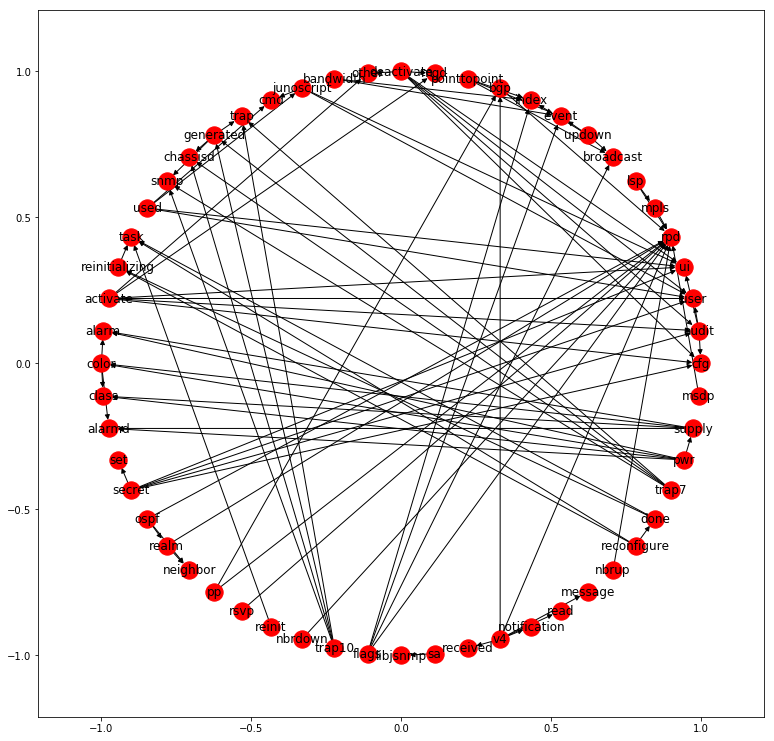

In [16]:
plt.figure(figsize=(13, 13))
nx.draw_networkx(G, pos=nx.shell_layout(G))
plt.show()

## LDA

### full length

In [426]:
all_words = list(set([word for cat, words in all_corpus.items() for word in words]))
word_dict = {w:i for i, w in enumerate(all_words)}
inv_word_dict = {v:k for k,v in word_dict.items()}

corpus = []
for cat, lts in lt_per_cat.items():
    for lt in lts:
        words = [remove_symbols(t) for t in lt.split()]
        split_words = []
        for w in words:
            if len(w.split()) > 1: # さらに分割できる場合
                split_words.extend(w.split())
            else:
                split_words.append(w)
        split_words = [t.lower() for t in split_words if t != '']
#         split_words = [t for t in split_words if t != 'ui']
        lt_word_id_cnt = collections.Counter([word_dict[w] for w in split_words])
        
        corpus.append([(tid, cnt) for tid, cnt in lt_word_id_cnt.items()])

In [427]:
lda = gensim.models.ldamodel.LdaModel(corpus=corpus, num_topics=30, id2word=inv_word_dict)

In [428]:
results =  [np.argmax(l) for l in lda.inference(corpus)[0]]
results = {ltid:r for ltid, r in enumerate(results)}

In [429]:
inf_ltids = {}
for ltid, inf_cat in results.items():
    if inf_cat in inf_ltids:
        inf_ltids[inf_cat].append(ltid)
    else:
        inf_ltids[inf_cat] = [ltid]

In [430]:
for inf_cat, ltids in inf_ltids.items():
    print("topic:", inf_cat)
    for i in ltids:
        print(raw_lt[str(i)]['lt'])
    print()

topic: 12
/usr/sbin/cron[**]: (root) CMD (newsyslog)
mib2d[**]: lacp info not found for ifl:**
mib2d[**]: cleared lacp info not found for ifl:**
/usr/sbin/cron[**]: (**) CMD (adjkerntz -a)
xntpd[**]: NTP Server Unreachable
last message repeated ** times
/kernel: MTU for ** reduced to **
**:rpd[**]: RPD_MPLS_LSP_UP: MPLS LSP ** up on primary(**) Route **(flag=**) **(Label=**) **(flag=**) **(Label=**) lsp bandwidth ** bps
snmpd[**]: SNMPD_TRAP_QUEUE_DRAINED: trap_dq_send_traps: traps queued to ** sent successfully
[**]: EVT ** ** ** MAC ** **:** Channel Group(**) is Up.
su: BAD SU ** to ** on **
mgd[**]: UI_CFG_AUDIT_OTHER: User '**' delete: [logical-systems ** interfaces ** unit **]
mgd[**]: UI_CFG_AUDIT_OTHER: User '**' delete: [logical-systems ** routing-instances **]
**:rpd[**]: RPD_TASK_REINIT: Reinitializing
/kernel: ae_bundlestate_ifd_change: bundle **: bundle IFD state changed to **
/kernel: GENCFG: op ** (CoS) failed; err ** (Invalid)
**:rpd[**]: RPD_RSVP_BYPASS_DOWN: RSVP bypas

In [431]:
lda.show_topics(num_topics=30)

[(0,
  '0.050*"flag" + 0.032*"label" + 0.028*"lsp" + 0.026*"rpd" + 0.023*"user" + 0.022*"ui" + 0.022*"mgd" + 0.020*"mpls" + 0.020*"up" + 0.015*"audit"'),
 (1,
  '0.033*"event" + 0.020*"#" + 0.020*"multicast" + 0.020*"rpd" + 0.020*"broadcast" + 0.020*"index" + 0.017*"to" + 0.016*"address" + 0.013*"pfeman" + 0.013*"request"'),
 (2,
  '0.032*"rpd" + 0.027*"error" + 0.022*"as" + 0.015*"peer" + 0.015*"bgp" + 0.015*"message" + 0.015*"to" + 0.013*"open" + 0.013*"from" + 0.013*"notification"'),
 (3,
  '0.051*"rpd" + 0.047*"lsp" + 0.047*"flag" + 0.035*"label" + 0.031*"mpls" + 0.025*"change" + 0.018*"on" + 0.017*"snmp" + 0.017*"route" + 0.015*"bps"'),
 (4,
  '0.122*"flag" + 0.097*"label" + 0.082*"lsp" + 0.060*"rpd" + 0.051*"mpls" + 0.030*"route" + 0.026*"bandwidth" + 0.026*"bps" + 0.025*"on" + 0.021*"change"'),
 (5,
  '0.045*"rpd" + 0.032*"to" + 0.022*"from" + 0.020*"ui" + 0.020*"user" + 0.019*"mgd" + 0.019*"flag" + 0.016*"neighbor" + 0.015*"audit" + 0.015*"cfg"'),
 (6,
  '0.026*"user" + 0.022*"

In [207]:
compared_results = {}
for inf_cat, ltids in inf_ltids.items():
    print("topic:", inf_cat)
    for ltid in ltids:
        true_cat = raw_lt[str(ltid)]['cat']
        if true_cat in compared_results:
            compared_results[true_cat].append((ltid, inf_cat))
        else:
            compared_results[true_cat] = [(ltid, inf_cat)]
    print()

topic: 5

topic: 4

topic: 2

topic: 7

topic: 3

topic: 8

topic: 6

topic: 9

topic: 0

topic: 1



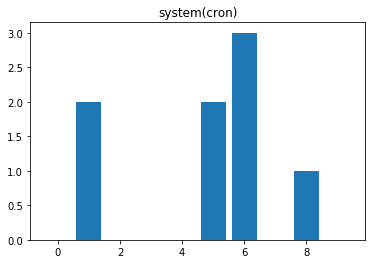

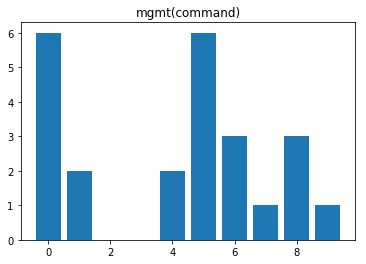

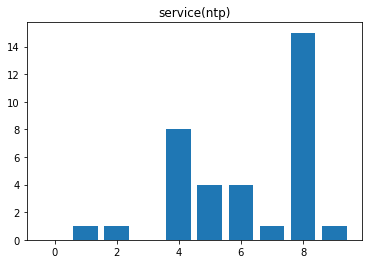

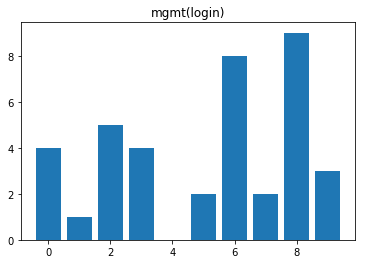

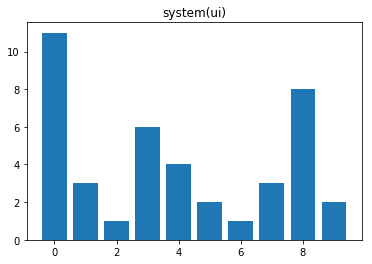

...

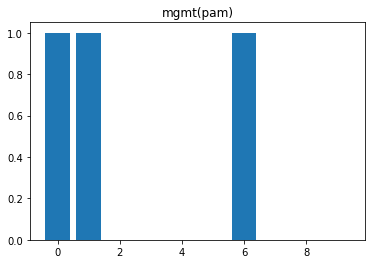

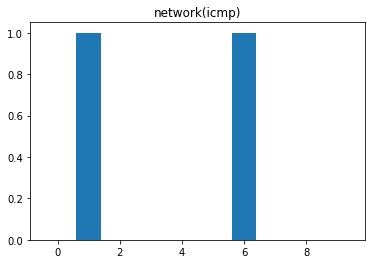

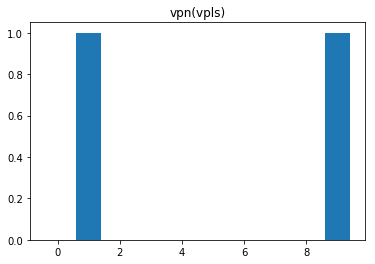

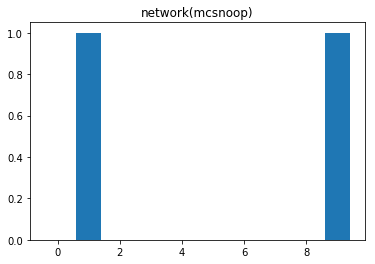

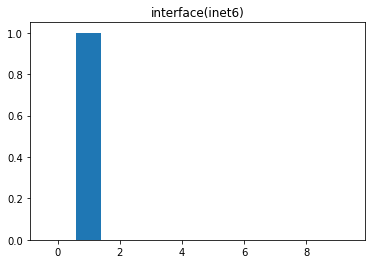

In [208]:
for cat, res in compared_results.items():
    plt.figure()
    plt.title(cat)
    y = collections.Counter([r[1] for r in res])
    y = [y[i] if i in y else 0 for i in range(10)]
#     print(collections.Counter([r[1] for r in res]), y)
    plt.bar(np.arange(10), y)
    plt.show()

### all split

In [290]:
all_corpus

{'egp(bgp)': ['rpd',
  'bgp',
  'send',
  'sending',
  'bytes',
  'to',
  'as',
  'blocked',
  'no',
  'spooling',
  'requested',
  'resource',
  'temporarily',
  'unavailable',
  'rpd',
  'bgp',
  'hold',
  'timeout',
  'notification',
  'sent',
  'to',
  'as',
  'code',
  'hold',
  'timer',
  'expired',
  'error',
  'reason',
  'holdtime',
  'expired',
  'for',
  'as',
  'socket',
  'buffer',
  'sndcc',
  'rcvcc',
  'tcp',
  'state',
  'snd',
  'una',
  'snd',
  'nxt',
  'snd',
  'wnd',
  'rcv',
  'nxt',
  'rcv',
  'adv',
  'hold',
  'timer',
  'rpd',
  'rpd',
  'bgp',
  'neighbor',
  'state',
  'changed',
  'bgp',
  'peer',
  'as',
  'changed',
  'state',
  'from',
  'to',
  'event',
  'rpd',
  'bgp',
  'read',
  'v4',
  'message',
  'notification',
  'received',
  'from',
  'as',
  'code',
  'hold',
  'timer',
  'expired',
  'error',
  'socket',
  'buffer',
  'sndcc',
  'rcvcc',
  'tcp',
  'state',
  'snd',
  'una',
  'snd',
  'nxt',
  'snd',
  'wnd',
  'rcv',
  'nxt',
  'rcv',
  '

In [432]:
all_words = list(set([word for cat, words in all_corpus.items() for word in words]))
word_dict = {w:i for i, w in enumerate(all_words)}
inv_word_dict = {v:k for k,v in word_dict.items()}

corpus = []
for cat, lts in lt_per_cat.items():
    for lt in lts:
        words = [remove_symbols(t) for t in lt.split()]
        split_words = []
        for w in words:
            if len(w.split()) > 1: # さらに分割できる場合
                split_words.extend(w.split())
            else:
                split_words.append(w)
        split_words = [t.lower() for t in split_words if t != '']
        
        split_words = split_words[:7]
        split_words = [t for t in split_words if t != 'ui']
        
        lt_word_id_cnt = collections.Counter([word_dict[w] for w in split_words])
        
        corpus.append([(tid, cnt) for tid, cnt in lt_word_id_cnt.items()])

In [433]:
lda = gensim.models.ldamodel.LdaModel(corpus=corpus, num_topics=30, id2word=inv_word_dict)

In [434]:
results =  [np.argmax(l) for l in lda.inference(corpus)[0]]
results = {ltid:r for ltid, r in enumerate(results)}

In [436]:
inf_ltids = {}
for ltid, inf_cat in results.items():
    if inf_cat in inf_ltids:
        inf_ltids[inf_cat].append(ltid)
    else:
        inf_ltids[inf_cat] = [ltid]

In [437]:
for inf_cat, ltids in inf_ltids.items():
    print("topic:", inf_cat)
    for i in ltids:
        print(len(ltids))
        break
#         print(raw_lt[str(i)]['lt'])
    print()

topic: 8
56

topic: 5
26

topic: 25
30

topic: 13
67

topic: 18
41

topic: 15
99

topic: 22
33

topic: 19
77

topic: 17
35

topic: 20
22

topic: 12
177

topic: 24
29

topic: 28
27

topic: 3
43

topic: 14
41

topic: 2
55

topic: 11
30

topic: 7
214

topic: 1
54

topic: 6
38

topic: 27
32

topic: 16
272

topic: 26
45

topic: 0
23

topic: 29
58

topic: 10
30

topic: 21
22

topic: 4
54

topic: 9
39

topic: 23
20



In [438]:
for inf_cat, ltids in inf_ltids.items():
    print("topic:", inf_cat)
    for i in ltids:
        print(raw_lt[str(i)]['lt'])
    print()

topic: 8
/usr/sbin/cron[**]: (root) CMD (newsyslog)
/usr/sbin/cron[**]: (**) CMD (adjkerntz -a)
mgd[**]: UI_AUTH_EVENT: Authenticated user '**' at permission level '**'
mgd[**]: UI_LOGIN_EVENT: User '**' login, class '**' [**], ssh-connection '', client-mode 'cli'
mgd[**]: UI_CHILD_START: Starting child '**'
mgd[**]: UI_CHILD_STATUS: Cleanup child '**', PID **, status **
mgd[**]: UI_LOGIN_EVENT: User '**' login, class '**' [**], ssh-connection '** ** ** **', client-mode 'cli'
/kernel: mld6_input: src ** is not link-local (grp=**)
xntpd[**]: frequency initialized ** PPM from **
[**]: EVT ** ** ** PORT ** ** **:** Error detected on the port.
snmpd[**]: SNMPD_TRAP_QUEUED: Adding trap to ** to ** queue, ** traps in queue
**:rpd[**]: RPD_MPLS_LSP_UP: MPLS LSP ** up on primary(**) Route **(flag=**) **(flag=** Label=**) **(flag=**) **(flag=** Label=**) **(flag=**) **(Label=**) **(flag=**) **(Label=**) **(flag=**) **(Label=**) lsp bandwidth ** bps
**:rpd[**]: RPD_MPLS_LSP_UP: MPLS LSP ** up on

In [439]:
lda.show_topics(num_topics=30)

[(0,
  '0.100*"set" + 0.072*"mgd" + 0.070*"user" + 0.070*"audit" + 0.070*"cfg" + 0.027*"other" + 0.021*"snmpd" + 0.019*"trap" + 0.015*"snmp" + 0.013*"chassisd"'),
 (1,
  '0.059*"junoscript" + 0.051*"user" + 0.046*"mgd" + 0.043*"rpd" + 0.032*"set" + 0.030*"cmd" + 0.030*"used" + 0.022*"chassisd" + 0.020*"rsvp" + 0.019*"cfg"'),
 (2,
  '0.030*"user" + 0.028*"chassisd" + 0.020*"set" + 0.017*"pic" + 0.017*"snmp" + 0.017*"event" + 0.016*"cfg" + 0.016*"mgd" + 0.016*"audit" + 0.015*"to"'),
 (3,
  '0.088*"rpd" + 0.053*"mgd" + 0.049*"cfg" + 0.049*"audit" + 0.048*"user" + 0.037*"other" + 0.033*"mpls" + 0.033*"lsp" + 0.030*"set" + 0.025*"delete"'),
 (4,
  '0.078*"rpd" + 0.032*"lsp" + 0.031*"mpls" + 0.023*"bgp" + 0.020*"to" + 0.017*"slot" + 0.014*"process" + 0.014*"sent" + 0.014*"/kernel" + 0.014*"config"'),
 (5,
  '0.042*"index" + 0.038*"event" + 0.038*"broadcast" + 0.038*"rpd" + 0.022*"pointtopoint" + 0.022*"audit" + 0.022*"cfg" + 0.022*"user" + 0.020*"multicast" + 0.020*"updown"'),
 (6,
  '0.045*

In [235]:
inf_ltids = {}
for ltid, inf_cat in results.items():
    if inf_cat in inf_ltids:
        inf_ltids[inf_cat].append(ltid)
    else:
        inf_ltids[inf_cat] = [ltid]

In [236]:
compared_results_3 = {}
for inf_cat, ltids in inf_ltids.items():
    for ltid in ltids:
        true_cat = raw_lt[str(ltid)]['cat']
        if true_cat in compared_results_3:
            compared_results_3[true_cat].append((ltid, inf_cat))
        else:
            compared_results_3[true_cat] = [(ltid, inf_cat)]

In [272]:
vec_per_topic = dict()
for tpid, vecs in lda.show_topics(formatted=False):
    tp_vec = np.zeros(len(word_dict), dtype=float)
    for vec in vecs:
        v = np.zeros(len(word_dict), dtype=float)
        v[word_dict[vec[0]]] = 1
        tp_vec += v*vec[1]
    vec_per_topic[tpid] = tp_vec
    
for a, b in itertools.combinations(vec_per_topic.keys(), 2):
    print(a, b)
    print(np.dot(vec_per_topic[a], vec_per_topic[b]))

0 1
0.03509249334462071
0 2
0.026893359610248548
0 3
0.0051768852746418535
0 4
0.004140990630081439
0 5
0.02208050993419355
0 6
0.0009836703289418727
0 7
0.0005277989989339246
0 8
0.0052582846025873015
0 9
0.00032812022803875227
1 2
0.03039967846972706
1 3
0.005484812707987161
1 4
0.0037617298899566692
1 5
0.02247725313401623
1 6
0.0
1 7
0.0
1 8
0.005572502490366928
1 9
0.0
2 3
0.004580599001441001
2 4
0.005394606308324536
2 5
0.022478815347798317
2 6
0.008697599396952638
2 7
0.002790762882933784
2 8
0.004463787921971586
2 9
0.00355380475614598
3 4
0.0011791362902130193
3 5
0.004990295592785056
3 6
0.0
3 7
0.0
3 8
0.0010724499663289557
3 9
0.0
4 5
0.005613557636412948
4 6
0.0069664813150427125
4 7
0.007897626287489305
4 8
0.0012875865202139278
4 9
0.0017881058980339648
5 6
0.005304339637867306
5 7
0.0028461010447305424
5 8
0.004689344093983486
5 9
0.0017693541020437353
6 7
0.008288125204622238
6 8
0.0
6 9
0.005940011517173674
7 8
0.00024438526197097937
7 9
0.0020720723283505077
8 9
0.0

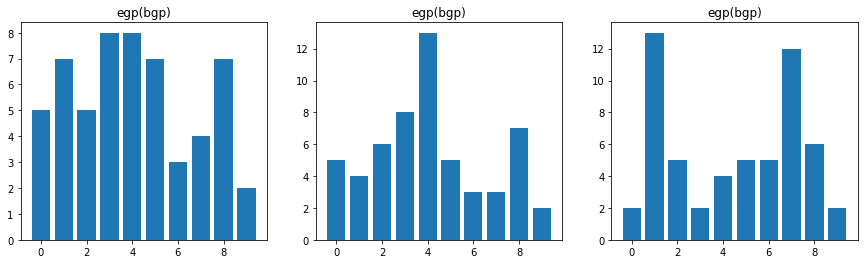

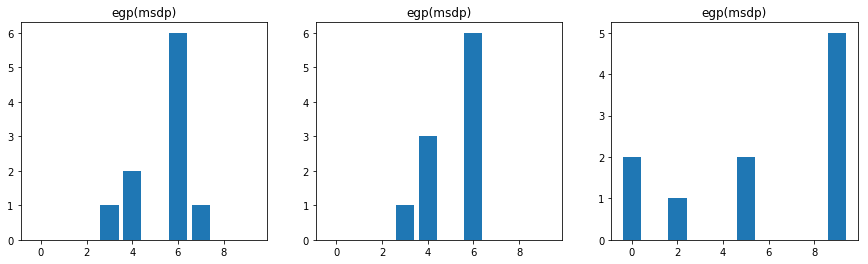

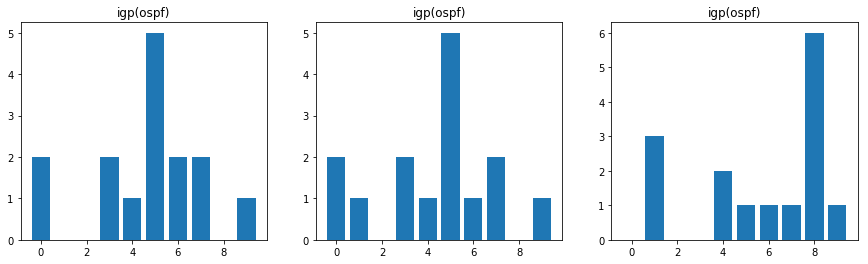

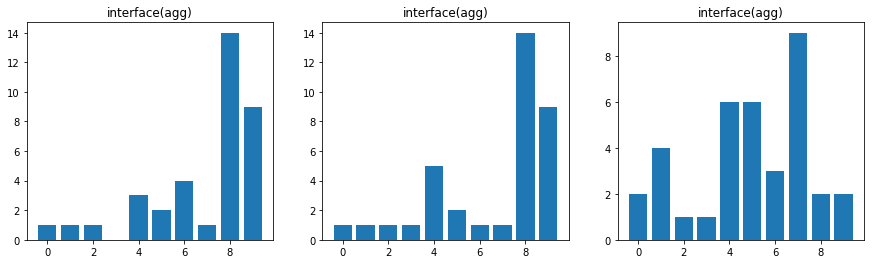

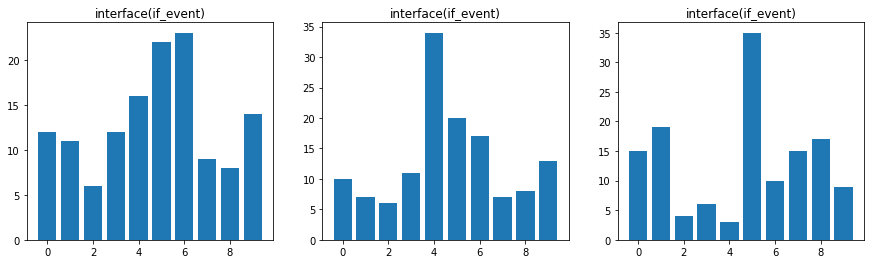

...

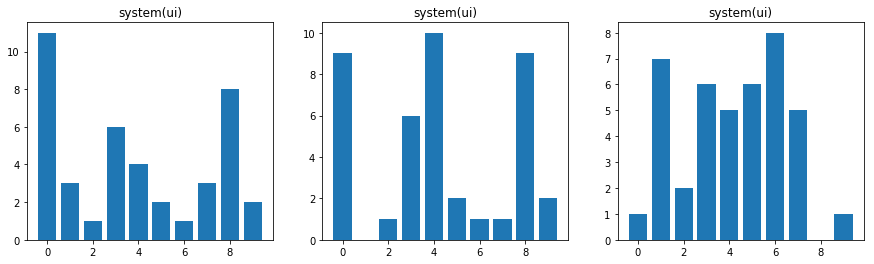

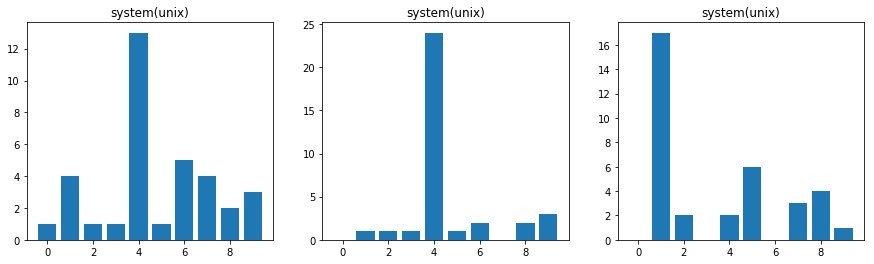

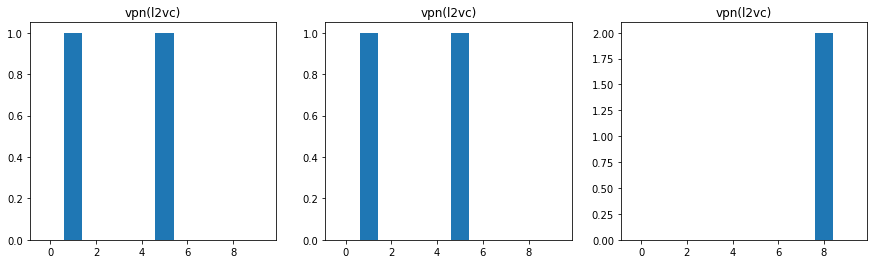

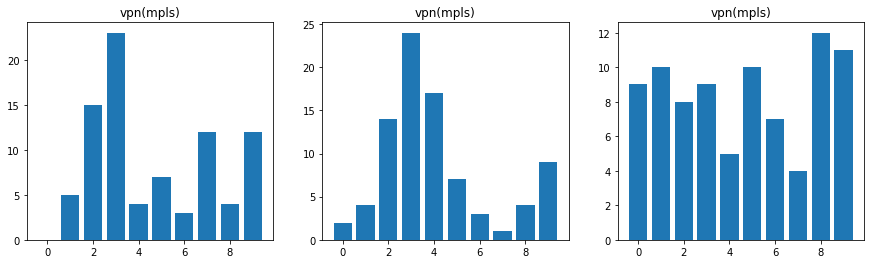

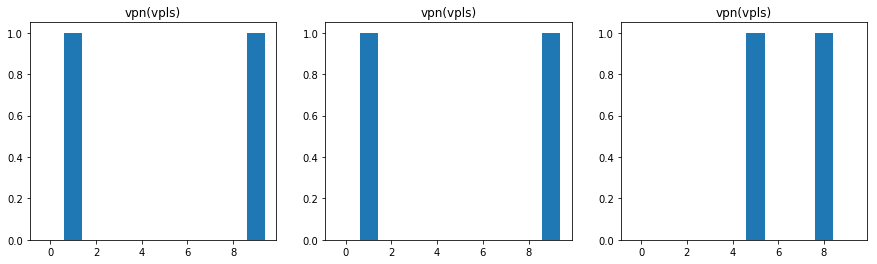

In [237]:
for (cat, res), (cat2, res2), (cat3, res3)  in zip(sorted(compared_results.items()), sorted(compared_results_2.items()), sorted(compared_results_3.items())):
    plt.figure(figsize=(15, 4))
    plt.subplot(131)
    plt.title(cat)
    y = collections.Counter([r[1] for r in res])
    y = [y[i] if i in y else 0 for i in range(10)]
    plt.bar(np.arange(10), y)
    plt.subplot(132)
    plt.title(cat2)
    y = collections.Counter([r[1] for r in res2])
    y = [y[i] if i in y else 0 for i in range(10)]
    plt.bar(np.arange(10), y)
    plt.subplot(133)
    plt.title(cat3)
    y = collections.Counter([r[1] for r in res3])
    y = [y[i] if i in y else 0 for i in range(10)]
    plt.bar(np.arange(10), y)
    
    plt.show()

### split

In [191]:
all_words = list(set([word for cat, words in all_corpus.items() for word in words]))
word_dict = {w:i for i, w in enumerate(all_words)}
inv_word_dict = {v:k for k,v in word_dict.items()}

corpus = []
for cat, lts in lt_per_cat.items():
    for lt in lts:
        words = [remove_symbols(t) for t in lt.split()]
        split_words = []
        for w in words:
            if len(w.split()) > 1: # さらに分割できる場合
                split_words.extend(w.split())
            else:
                split_words.append(w)
        split_words = [t.lower() for t in split_words if t != '']
        
        split_words = split_words[:7]
        
        lt_word_id_cnt = collections.Counter([word_dict[w] for w in split_words])
        
        corpus.append([(tid, cnt) for tid, cnt in lt_word_id_cnt.items()])

In [113]:
# lda = gensim.models.ldamodel.LdaModel(corpus=corpus, num_topics=10, id2word=inv_word_dict)

In [192]:
results =  [np.argmax(l) for l in lda.inference(corpus)[0]]
results = {ltid:r for ltid, r in enumerate(results)}

In [193]:
inf_ltids = {}
for ltid, inf_cat in results.items():
    if inf_cat in inf_ltids:
        inf_ltids[inf_cat].append(ltid)
    else:
        inf_ltids[inf_cat] = [ltid]

In [194]:
for inf_cat, ltids in inf_ltids.items():
    print("topic:", inf_cat)
    for i in ltids:
        print(raw_lt[str(i)]['lt'])
    print()

topic: 5
/usr/sbin/cron[**]: (root) CMD (newsyslog)
/usr/sbin/cron[**]: (**) CMD (adjkerntz -a)
mgd[**]: UI_JUNOSCRIPT_CMD: User '**' used JUNOScript client to ** command 'show system **'
mgd[**]: UI_JUNOSCRIPT_CMD: User '**' used JUNOScript client to ** command '**'
xntpd[**]: kernel time sync enabled **
[**]: EVT ** ** ** ACCESS ** **:** Login ** from ** (**)**
mgd[**]: UI_LOGIN_EVENT: User '**' login, class '**' [**], ssh-connection '** ** ** **', client-mode 'cli'
[**]: EVT ** ** ** PORT ** ** **:** NIF ** Port **:broadcast storm recovered.
pfed: PFED: rtslib sequence gap ** - **
pfed: PFED: rtsock init completed.
[**]: EVT ** ** ** SOFTWARE ** **:** Processed the packets in the queue to CPU.
pfed: rtslib: ERROR IDL IDR Decode Error **(Invalid Buffer Size)
su: ** to ** on **
ifinfo: cleared lacp info not found for ifl:**
mgd[**]: UI_JUNOSCRIPT_CMD: User '**' used JUNOScript client to run command 'get-virtual-chassis-adjacency-information verbosity_level=**'
mgd[**]: UI_JUNOSCRIPT_C

In [195]:
inf_ltids = {}
for ltid, inf_cat in results.items():
    if inf_cat in inf_ltids:
        inf_ltids[inf_cat].append(ltid)
    else:
        inf_ltids[inf_cat] = [ltid]

In [200]:
compared_results_2 = {}
for inf_cat, ltids in inf_ltids.items():
    for ltid in ltids:
        true_cat = raw_lt[str(ltid)]['cat']
        if true_cat in compared_results_2:
            compared_results_2[true_cat].append((ltid, inf_cat))
        else:
            compared_results_2[true_cat] = [(ltid, inf_cat)]

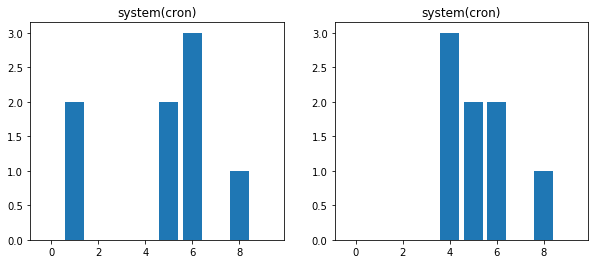

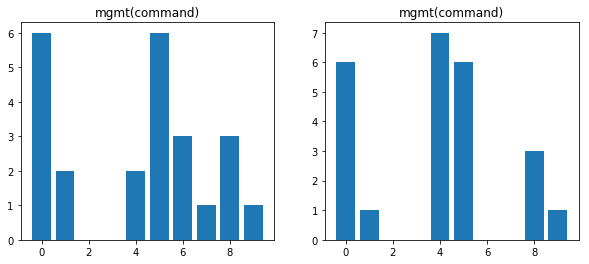

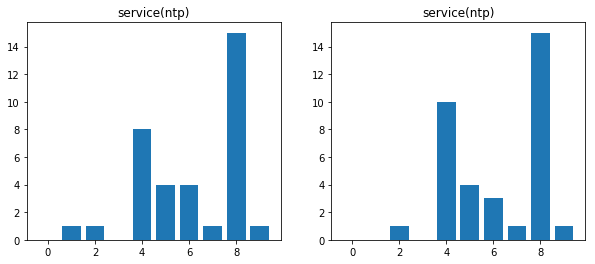

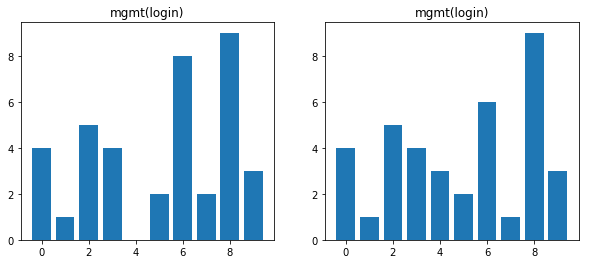

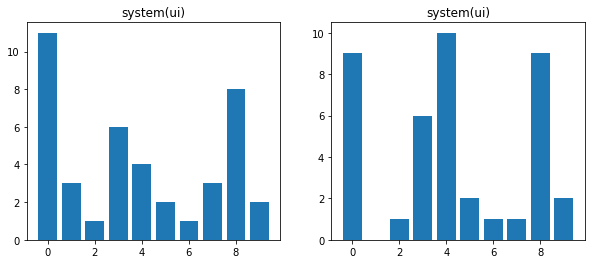

...

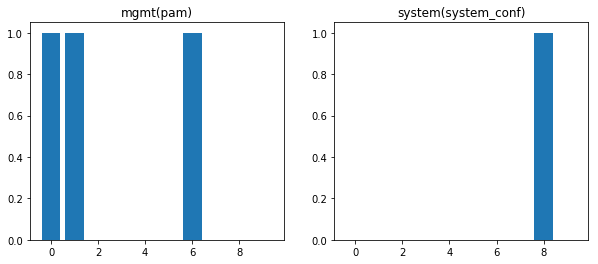

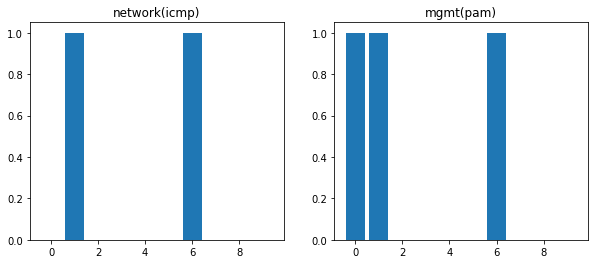

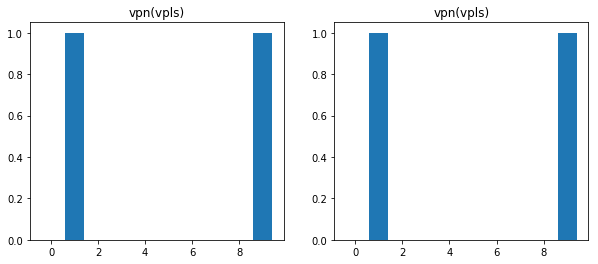

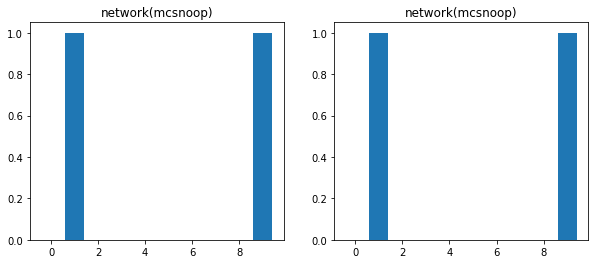

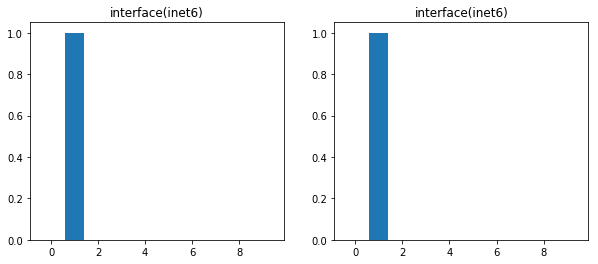

In [211]:
for (cat, res), (cat2, res2) in zip(compared_results.items(), compared_results_2.items()):
    plt.figure(figsize=(10, 4))
    plt.subplot(121)
    plt.title(cat)
    y = collections.Counter([r[1] for r in res])
    y = [y[i] if i in y else 0 for i in range(10)]
    plt.bar(np.arange(10), y)
    plt.subplot(122)
    plt.title(cat2)
    y = collections.Counter([r[1] for r in res2])
    y = [y[i] if i in y else 0 for i in range(10)]
    plt.bar(np.arange(10), y)
    
    plt.show()

In [283]:
model.most_similar('To')

[('Trying', 0.6606096029281616),
 ('Attempting', 0.6284765601158142),
 ('Wanting', 0.6178721189498901),
 ('Could', 0.6174774765968323),
 ('Hoping', 0.589070737361908),
 ('Can', 0.5673538446426392),
 ('Let', 0.5673077702522278),
 ('Should', 0.5631802678108215),
 ('Would', 0.5621656179428101),
 ('Please', 0.5425098538398743)]

## word2vec

In [6]:
model = gensim.models.KeyedVectors.load_word2vec_format('./GoogleNews-vectors-negative300.bin', binary=True)

In [15]:
vec_per_cat = {}
for cat, words in all_corpus.items():
    vec_per_cat[cat] = []
    for word in words:
        print(word)
        if word in model.vocab.keys():
            vec_per_cat[cat].append(model.get_vector(word))
        else:
            pass

/usr/libexec/atrun
/usr/sbin/check-support
newsyslog
*system*
reload
cmd
-a
root
/etc/crontab
-l
/usr/sbin/cron
adjkerntz
ifinfo
lacp
info
ifl
is
new
lacpd timeout
current
lacpd
lacp update state userspace
mib2d
kern lacp intf state change
cleared
expired
/kernel
timer
not
found
for
receive
cifd
state
while
exiting
precision
re-established
step
stratum=
ppm
synchronized
unreachable
ntpdate
on
usec
sync
ntpd changed time
from
reset
time
status
ntpd
to
=
mlockall
connection
kernel
#
s
signal
interface
listening
initialized
xntpd
disabled
reachable
unavailable
4.2.0-a
server
no
+
resource
ntp
enabled
servers
offset
temporarily
ntpdate time changed
frequency
queue
pic
repeated
messages
times
syslog
lost
overflowed.
slot
last
message
for
mtu
rpd
<mtu>
pointtopoint
#
mcsn
address
<up
broadcast
index
reduced
multicast>
<broadcast
to
/kernel
loopback
event
logged
timed
in.
logout
after
''
log.
failures
login failed
aborted
username
number
login information
esc
incorrect
invalid
users
on
host
r

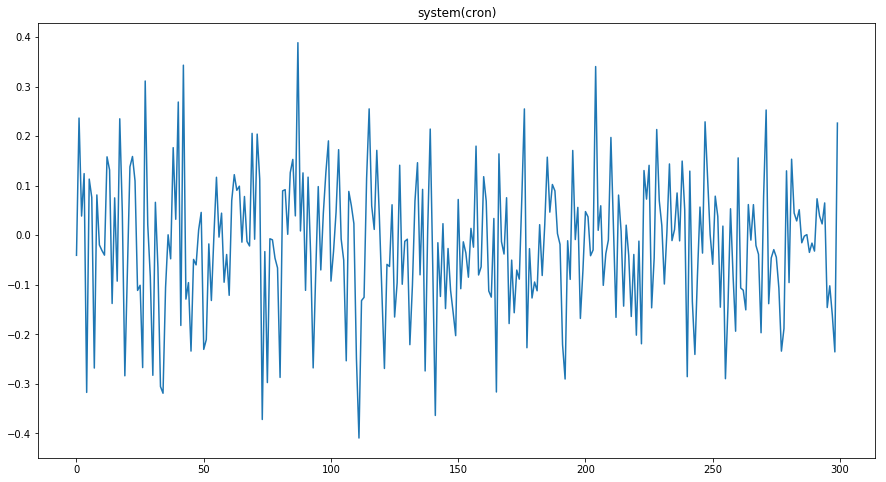

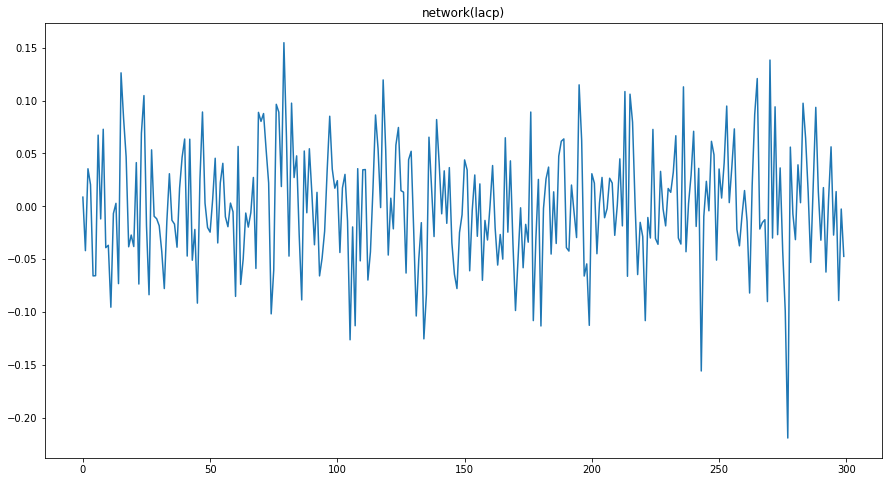

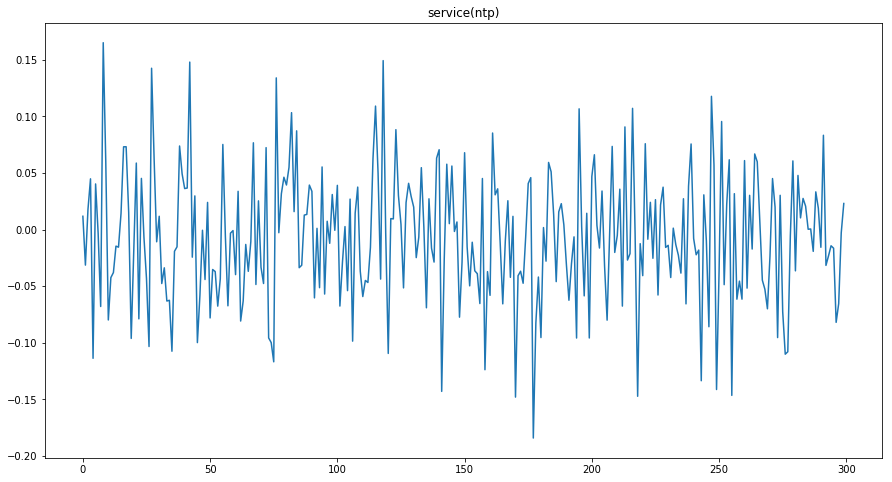

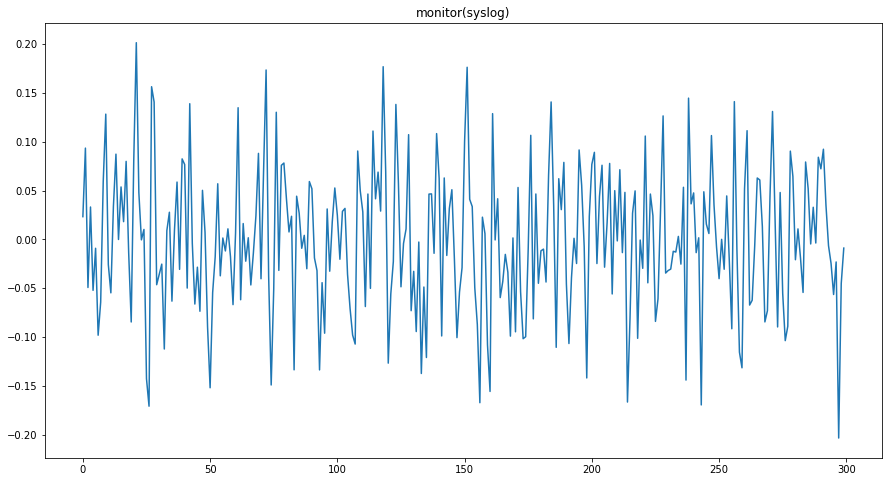

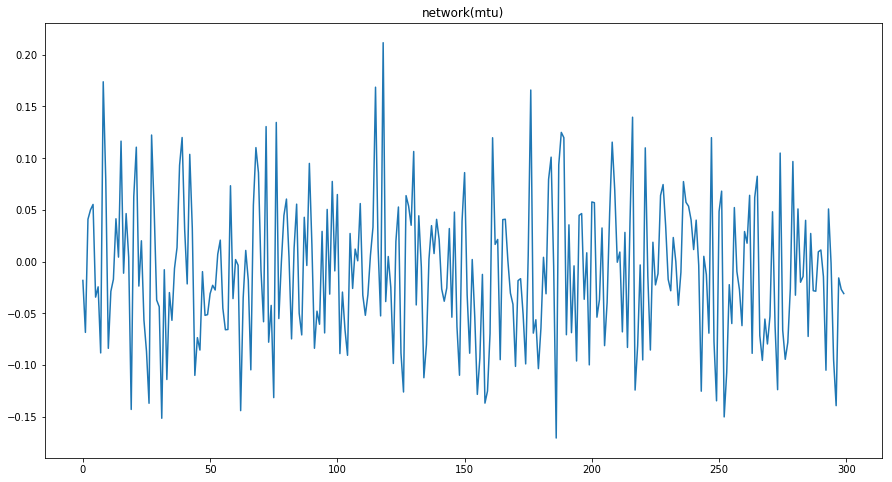

...

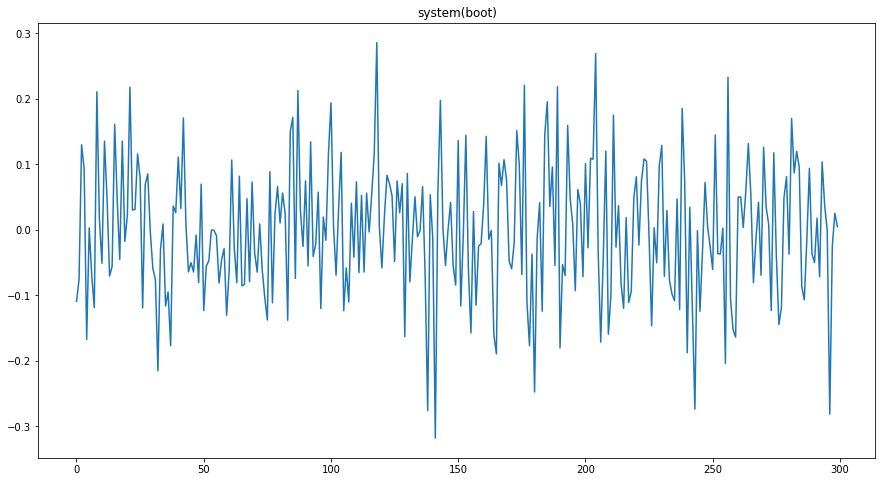

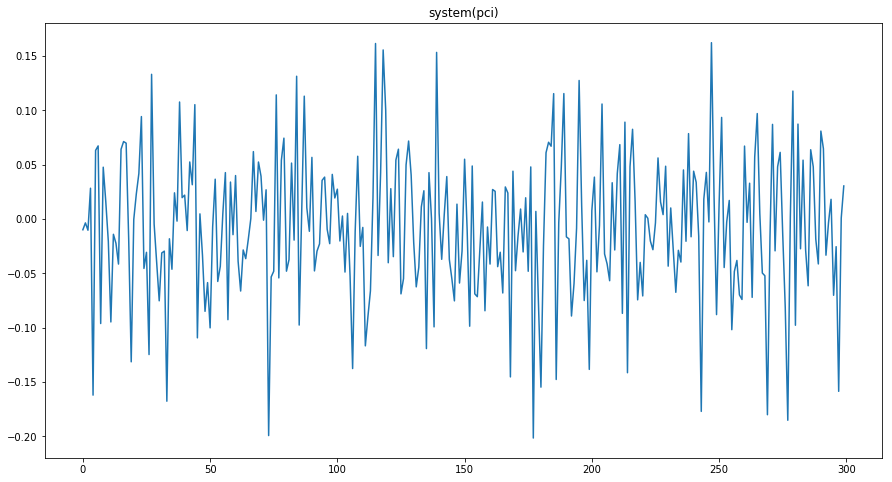

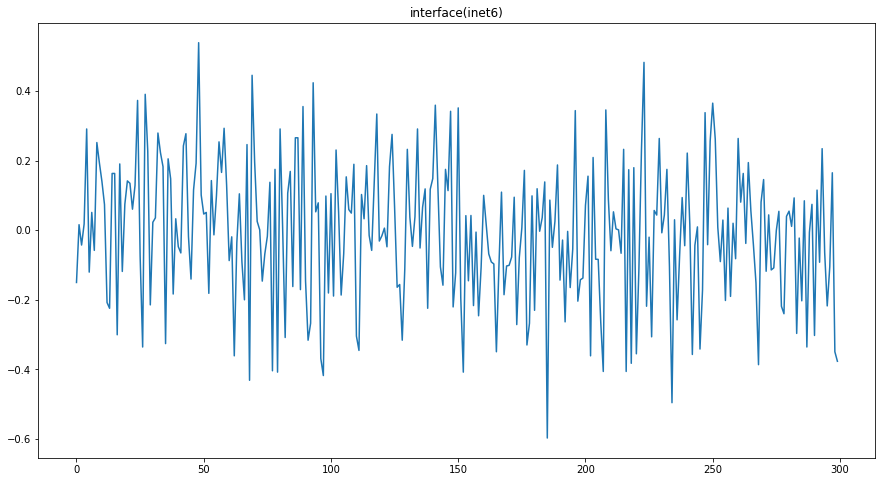

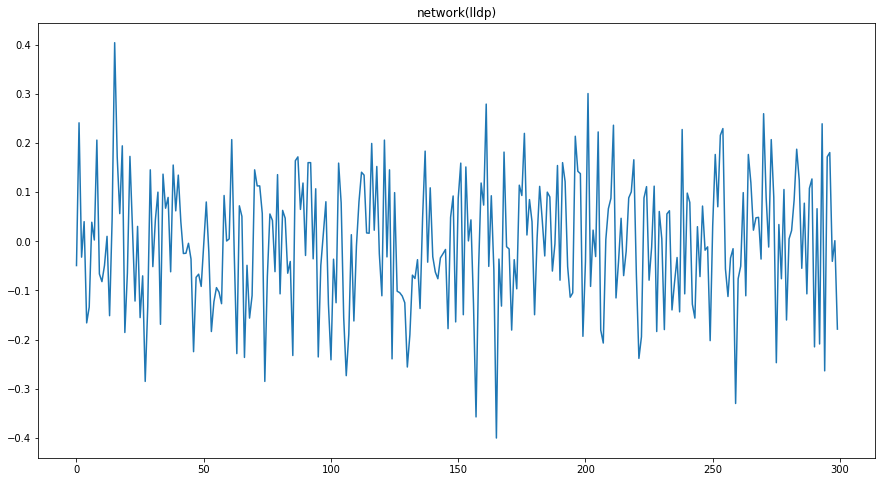

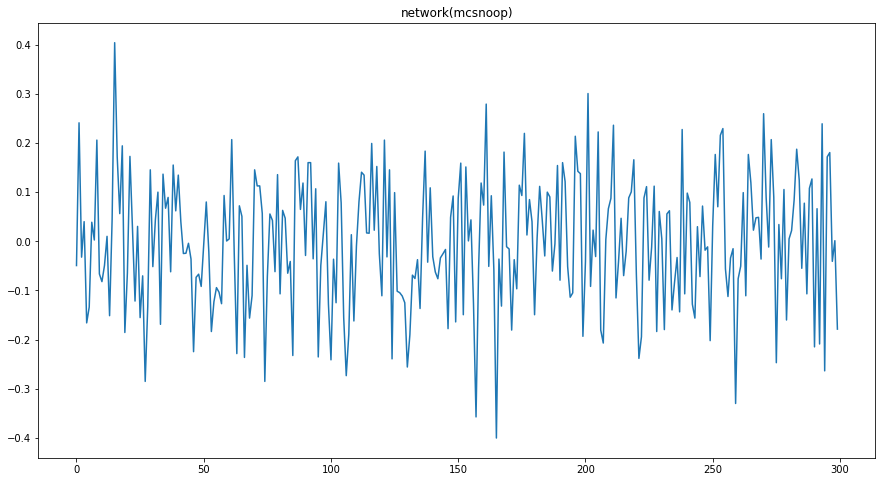

In [18]:
for cat, vecs in vec_per_cat.items():
    plt.figure(figsize=(15, 8))
    plt.title(cat)
    
    plt.plot(np.apply_along_axis(lambda x: x.mean(), 0, np.array(vecs)))
#     for vec in vecs:
#         plt.plot(vec)
    plt.show()